In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys
sys.path.append(os.path.realpath('..'))

In [3]:
import numpy as np
import scipy as sp
import pandas as pd
import plotly.express as ex
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from copy import deepcopy

from IPython.display import display
import ipywidgets.widgets as widgets

from tracking_v2.target import ConstantVelocityTarget
from tracking_v2.kalman import LinearKalmanFilter
from tracking_v2.motion import ConstantVelocityModel, ConstantAccelerationModel, SingerAccelerationModel
from tracking_v2.sensor import GeometricSensor
from tracking_v2.evaluation import Runner, run_many, evaluate_many, plot_nees, evaluate_nees

from tracking.util import to_df

In [4]:
def two_columns(fig1, fig2):
    output1 = widgets.Output(layout={'width': '50%'})
    with output1:
        display(fig1)

    output2 = widgets.Output(layout={'width': '50%'})
    with output2:
        display(fig2)
    
    column_layout = widgets.HBox([output1, output2])
    display(column_layout)

# Target and sensor

In this document we will consider a simple target moving with constant velocity along the X axis. The sensor produces 3D measurement in the Cartesian space with unit covariance matrix.

In [5]:
target = ConstantVelocityTarget()
sensor = GeometricSensor()

# Kalman Filter drift

In some situations, Kalman Filter's error has the tendency to drift - accumulate over time to large values of NEES.

Our target is moving with a perfectly constant velocity. The appropriate motion noise model would be of no noise, $Q = 0$. However, this leads to state covariance $\hat{P}$ converging to zero which places majority of "trust" into the current state estimate and increasingly less into each new measurement. With incorrect velocity estimates, this can push the state estimate to be quite off while the expected variance is minuscule.

Let's compare two situations: a KF with zero process noise and another with CV motion model with noise set to $1$.

In [6]:
class MyRunner(Runner):
    meas_noise = []

    def after_update(self, m):
        self.meas_noise.append(m.e.squeeze())

def drift(q):    
    motion = ConstantVelocityModel(q)
    kf = LinearKalmanFilter(motion, [[1, 0, 0, 0, 0, 0],
                                     [0, 1, 0, 0, 0, 0],
                                     [0, 0, 1, 0, 0, 0]])

    sensor = GeometricSensor(seed=8)
    r = MyRunner(target, sensor, kf)
    r.run_many(1, 500)
    return r

In [7]:
r0 = drift(0)
r1 = drift(1)

In [8]:
def _plot_error(runner):
    tm  = np.arange(runner.n-100).reshape((runner.n-100, -1))
    err = np.hstack((tm, np.abs(runner.one_x_hat[100:,:3,0] - runner.truth[101:,:3])))
    err = to_df(err, columns=['time', 'x', 'y', 'z']).melt(['time'], ['x', 'y', 'z'], 'dim', 'error')
    return ex.line(err, x='time', y='error', facet_row='dim')

two_columns(_plot_error(r0), _plot_error(r1))

In the right-hand-side plot, the absolute error accumulates up to about $0.5$ while in the left-hand-side plot the error does not show the pattern of accumulation, even though it consistently reaches much higher values, up to about $4$. However, the apparent advantage of the model with $Q=0$ disappears once we look at normalized errors (NEES).

In [9]:
def _plot_nees(runner):
    nees = evaluate_nees(runner.one_x_hat[:, :3, :], runner.one_P_hat[:, :3, :3], runner.truth[1:, :3])
    err = np.asarray((np.arange(runner.n-100), nees.scores[100:])).T
    err = to_df(err, columns=['time', 'nees'])
    fig = ex.line(err, x='time', y='nees')
    
    ci = sp.stats.chi2.ppf([0.025, 0.975], nees.dim)
    fig.add_hline(y=ci[0], line_width=.5, line_dash="dash", line_color="red")
    fig.add_hline(y=ci[1], line_width=.5, line_dash="dash", line_color="red")

    return fig

two_columns(_plot_nees(r0), _plot_nees(r1))

Using non-zero process noise leads to NEES scores which do not show the tendency to accumulate over time. They also seem to remain within the 95% confidence interval. This will not look as great once we take a look at multiple independent runs of these two filters.

# Multiple independent runs

## NEES statistics

In [11]:
motion = ConstantVelocityModel(0)
kf = LinearKalmanFilter(motion, [[1, 0, 0, 0, 0, 0],
                                 [0, 1, 0, 0, 0, 0],
                                 [0, 0, 1, 0, 0, 0]])

cv0 = run_many(100, 400, target, sensor, kf)
cv0_eval = evaluate_many(*cv0)

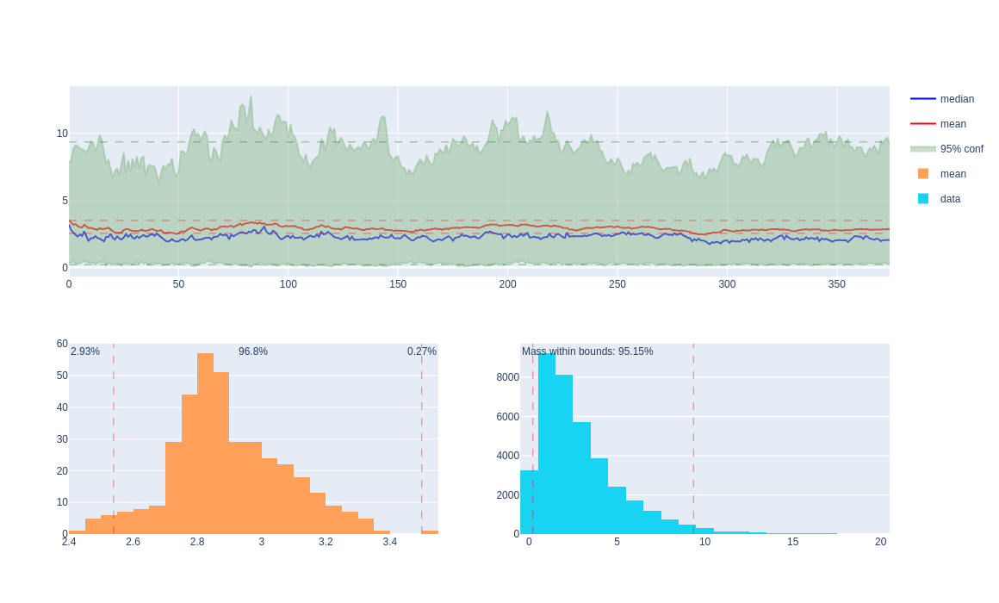

In [12]:
plot_nees(cv0_eval.position_nees)

In [13]:
motion = ConstantVelocityModel(1)
kf = LinearKalmanFilter(motion, [[1, 0, 0, 0, 0, 0],
                                 [0, 1, 0, 0, 0, 0],
                                 [0, 0, 1, 0, 0, 0]])

cv1 = run_many(100, 400, target, sensor, kf)
cv1_eval = evaluate_many(*cv1)

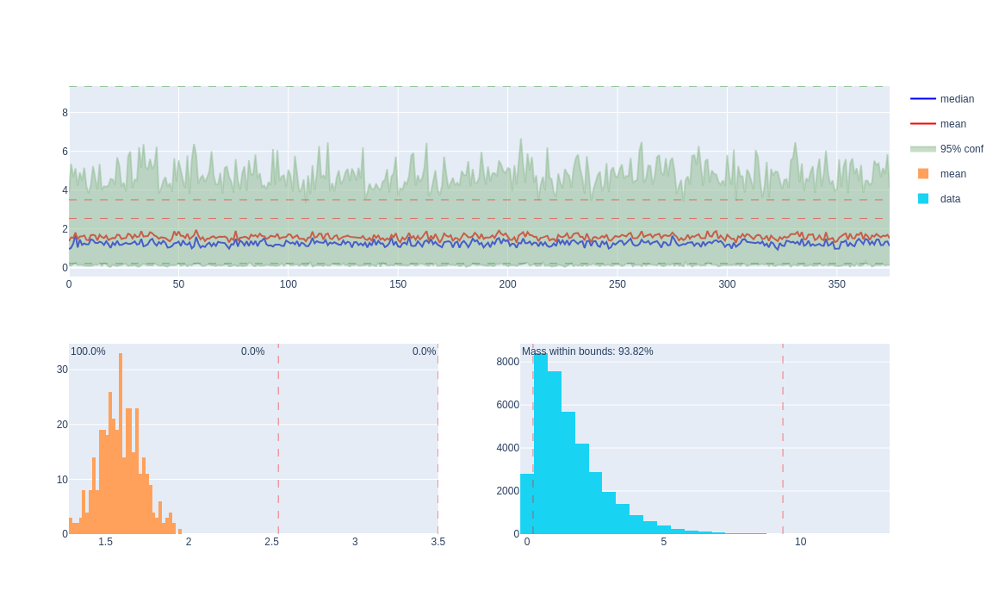

In [14]:
plot_nees(cv1_eval.position_nees)

In [15]:
motion = ConstantVelocityModel(3)
kf = LinearKalmanFilter(motion, [[1, 0, 0, 0, 0, 0],
                                 [0, 1, 0, 0, 0, 0],
                                 [0, 0, 1, 0, 0, 0]])

cv3 = run_many(100, 400, target, sensor, kf)
cv3_eval = evaluate_many(*cv3)

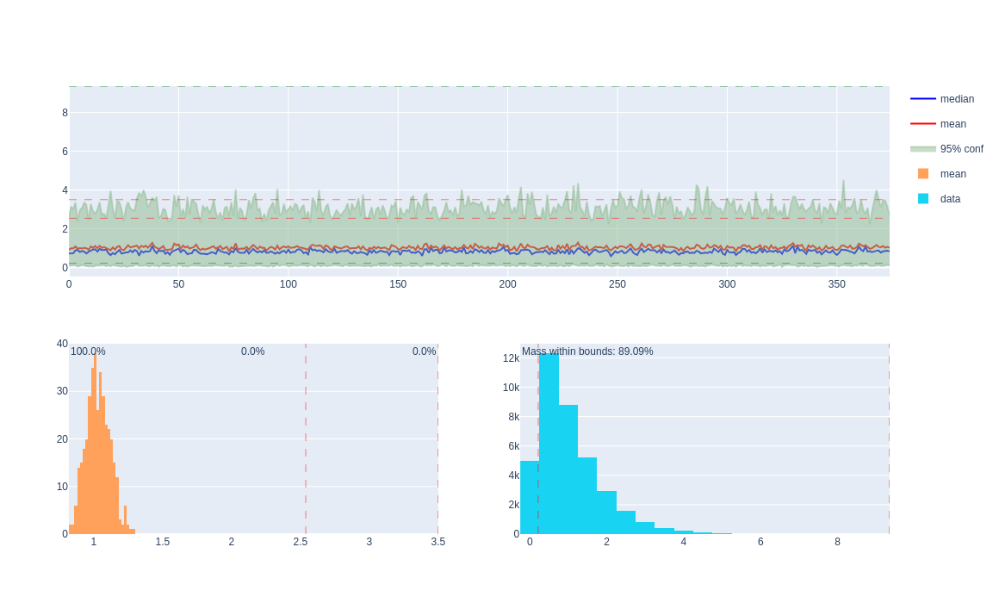

In [16]:
plot_nees(cv3_eval.position_nees)

## All individual runs

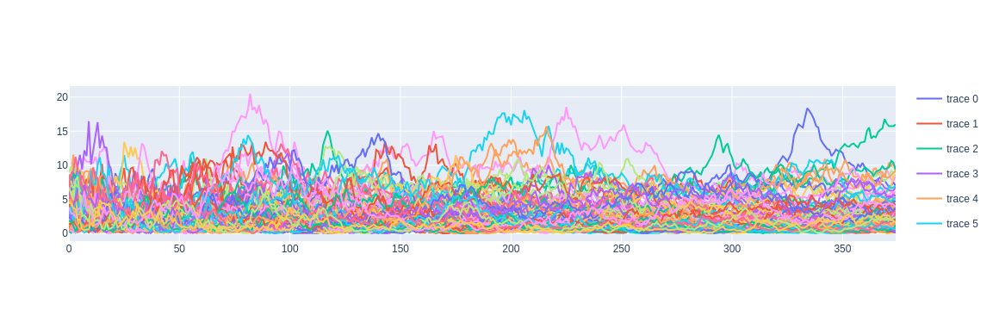

In [18]:
fig = go.Figure()
for i in range(cv0_eval.position_nees.scores.shape[0]):
    fig.add_trace(go.Scatter(x=np.arange(375), y=cv0_eval.position_nees.scores[i,25:], mode='lines', legendgroup=i))
fig.show()

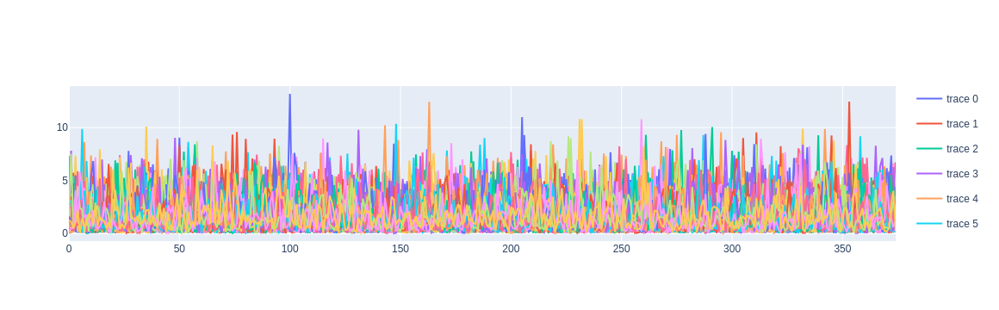

In [19]:
fig = go.Figure()
for i in range(cv1_eval.position_nees.scores.shape[0]):
    fig.add_trace(go.Scatter(x=np.arange(375), y=cv1_eval.position_nees.scores[i,25:], mode='lines', legendgroup=i))
fig.show()

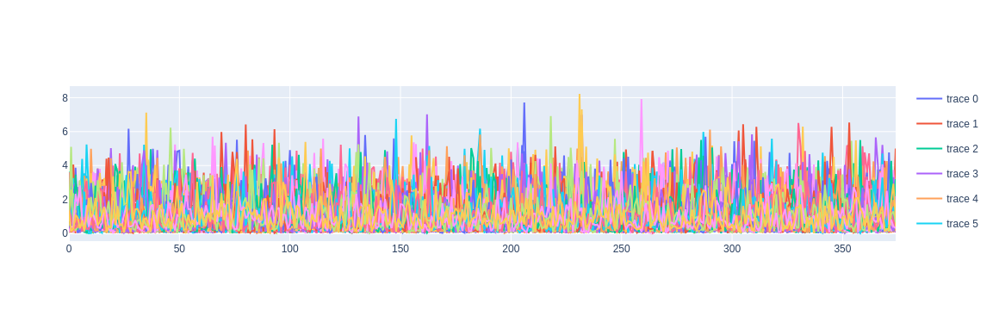

In [20]:
fig = go.Figure()
for i in range(cv3_eval.position_nees.scores.shape[0]):
    fig.add_trace(go.Scatter(x=np.arange(375), y=cv3_eval.position_nees.scores[i,25:], mode='lines', legendgroup=i))
fig.show()